#Style Transfer.

In this assignment you will implement the style transfer method of Gatys 2016 [Gatys, L.A., Ecker, A.S. and Bethge, M., 2016. Image style transfer using
convolutional neural networks. In Proceedings of the IEEE conference on
computer vision and pattern recognition (pp. 2414-2423)](https://arxiv.org/pdf/1508.06576)


* The method uses a pre-trained VGG network as a feature extractor with access to the convolutional layers of the network.
* The style and content images are passed through the network, the output of the convolution layers is stored. A noise image can be trained via gradient descent to minimise the loss between style and content feature maps, and cause the noise image to adopt the content of one image and the style of the other. (see details below and in paper)

![](https://github.com/tonyscan6003/etivities/blob/main/style_transfer.jpg?raw=true)

This notebook contains a series of steps some of which are completed and some which require completion (highlighted in bold).
1. Install and Import Packages.
2. Import Style and Content Images.
3. Define Feature Extraction Model.
4. **Define Loss Function**
5. **Define Training Step and Training Loop**


# 1. Install & Import Packages

In [1]:
!pip install torchinfo

In [2]:
from __future__ import absolute_import, division, print_function, unicode_literals
import time
import os
import numpy as np
import glob
import random
import requests
from PIL import Image
from io import BytesIO
import urllib.request
from urllib.parse import urlparse
import cv2
import numpy as np
import torch
import torch.nn.functional as F
from torch import nn
from torchvision import datasets, models, transforms
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import ToTensor, v2, Pad, Grayscale
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from torchvision.models.feature_extraction import get_graph_node_names
from torchvision.models.feature_extraction import create_feature_extractor
import matplotlib.pyplot as plt
from IPython.display import clear_output



##2. Import Style and Content Images

In the code cell below a custom dataset is created to download and save images from URLs (using __get_item__). These are then read by the dataset/dataloader enumeration. Each call to the dataloader will return the same image (as there is only one image in the dataset).

Note that this __get_item__ function is using cv2 and jpg format with coversion to numpy before converting to a tensor with torch.from_numpy. (Future update: As pytorch is natively compatible with PIL images, this function should use this format rather than CV2/numpy)

In [3]:
# URLs of the images (For style images see: https://en.wikipedia.org/wiki/Category:Modern_paintings)
style_url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/b/b4/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg/640px-Vassily_Kandinsky%2C_1913_-_Composition_7.jpg'
content_url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/f/f4/Neckarfront_T%C3%BCbingen_Mai_2017.jpg/621px-Neckarfront_T%C3%BCbingen_Mai_2017.jpg'
#content_url ='https://upload.wikimedia.org/wikipedia/commons/thumb/2/21/Adams_The_Tetons_and_the_Snake_River.jpg/600px-Adams_The_Tetons_and_the_Snake_River.jpg'
#content_url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/2/21/Dog_In_The_Grass.jpg/640px-Dog_In_The_Grass.jpg'
#style_url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/5/50/Colin_Goldberg%2C_Paravirtual_Orbit%2C_2012._Oil_and_pigment_print_on_canvas_with_gold_and_silver_leaf%2C_32_x_20_inches._Private_collection%2C_New_York..jpg/603px-Colin_Goldberg%2C_Paravirtual_Orbit%2C_2012._Oil_and_pigment_print_on_canvas_with_gold_and_silver_leaf%2C_32_x_20_inches._Private_collection%2C_New_York..jpg'
#style_url = "https://upload.wikimedia.org/wikipedia/en/b/b1/Jean_Lambert-Rucki%2C_1919%2C_La_Visite%2C_65_x_92_cm%2C_Mus%C3%A9e_des_Ann%C3%A9es_30%2C_Boulogne-Billancourt%2C_D%C3%A9p%C3%B4t_du_Centre_Georges_Pompidou%2C_MNAM%2C_Paris.jpg"

In [4]:
image_size=512
# Define the transformation to resize images to the same size and normalise
transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Define a custom dataset
class CustomImageDataset(Dataset):
    def __init__(self, image_url, save_path, transform=None):
        self.image_url = image_url
        self.transform = transform
        self.save_path = save_path

    def __len__(self):
        return len(self.image_url)

    def __getitem__(self, idx):
       filename = os.path.basename(urlparse(self.image_url).path)
       image_path = os.path.join(self.save_path, filename)

       # Check if the image already exists
       if os.path.exists(image_path):
           print(f"Image already exists at {image_path}. Reading from disk.")
           image = cv2.imread(image_path)
       else:
           print(f"Downloading image from {self.image_url}...")
           resp = urllib.request.urlopen(self.image_url)
           temp_image = np.asarray(bytearray(resp.read()), dtype="uint8")
           temp_image = cv2.imdecode(temp_image, cv2.IMREAD_COLOR)
           temp_image = cv2.cvtColor(temp_image, cv2.COLOR_BGR2RGB)
           print(f"Image downloaded and saved at {image_path}.")
           cv2.imwrite(image_path, temp_image)
           image = cv2.imread(image_path)
       print(np.shape(image))

       # Convert to tensor in range of 0->1 (from 0-255 int numpy array) and permute to channels last and add transforms
       image = torch.from_numpy(image)
       image = torch.div(image,255)
       image = image.to(torch.float32)
       image = torch.permute(image,(2,1,0))
       if self.transform:
          image = self.transform(image)

       return image




Image downloaded and saved at ./621px-Neckarfront_T%C3%BCbingen_Mai_2017.jpg.
(480, 621, 3)


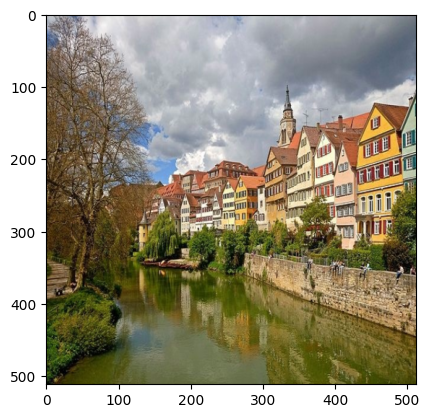

Image downloaded and saved at ./640px-Vassily_Kandinsky%2C_1913_-_Composition_7.jpg.
(420, 639, 3)


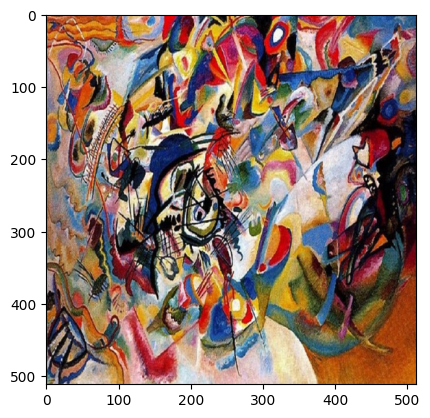

In [5]:
# Create datasets and dataloaders
content_dataset = CustomImageDataset(content_url, save_path='./', transform=transform)
content_dataloader = DataLoader(content_dataset, batch_size=1, shuffle=False)
style_dataset = CustomImageDataset(style_url, save_path='./', transform=transform)
style_dataloader = DataLoader(style_dataset, batch_size=1, shuffle=False)

# Function to display images from dataloader
def show_images(dataloader):

   # Call next image (always same image)
   dataiter = iter(dataloader)
   batch = next(dataiter)
   # Corret image for display
   img = batch[0]
   img = torch.permute(img.to('cpu'),(2,1,0)).numpy()
   mean = np.array([0.485, 0.456, 0.406])
   std = np.array([0.229, 0.224, 0.225])
   disp_image = std * img + mean
   disp_image = np.clip(disp_image, 0, 1)
   plt.imshow(disp_image)
   plt.show()

# Display images from dataloader
show_images(content_dataloader)
show_images(style_dataloader)


# 3. Define Feature Extraction model
Pytorch has an inbuilt [models package](https://pytorch.org/vision/stable/models.html) that allows loading of popular models with pre-trained weights.

* For style transfer we require access to the convolution layers of each block. The metholodolgy for loading the feature map outputs [is detailed here](https://pytorch.org/vision/stable/feature_extraction.html) (Note that in order to figure out layer numbers that should be output, we can use `get_graph_node_names`as detailed in the link).

* You can modify the exact choice of style and content convolution layers (if required) by changing layers in the return nodes dictionary.

In [6]:
# Get cpu, gpu or mps device for training.
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

Using cuda device


In [7]:
# Temporarily use get_graph_node_names
vgg19 = models.vgg19(pretrained=True)
train_nodes, eval_nodes = get_graph_node_names(vgg19)
print(train_nodes)


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:07<00:00, 77.2MB/s]


['x', 'features.0', 'features.1', 'features.2', 'features.3', 'features.4', 'features.5', 'features.6', 'features.7', 'features.8', 'features.9', 'features.10', 'features.11', 'features.12', 'features.13', 'features.14', 'features.15', 'features.16', 'features.17', 'features.18', 'features.19', 'features.20', 'features.21', 'features.22', 'features.23', 'features.24', 'features.25', 'features.26', 'features.27', 'features.28', 'features.29', 'features.30', 'features.31', 'features.32', 'features.33', 'features.34', 'features.35', 'features.36', 'avgpool', 'flatten', 'classifier.0', 'classifier.1', 'classifier.2', 'classifier.3', 'classifier.4', 'classifier.5', 'classifier.6']


In [8]:

# Define Dictionary of output nodes
return_nodes={'features.2':'style_conv1','features.4':'content_conv1','features.7':'style_conv2','features.9':'content_conv2','features.12':'style_conv3','features.14':'content_conv3','features.21':'style_conv4','features.23':'content_conv4','features.29':'style_conv5','features.31':'content_conv5'}

# Create new model using the return nodes
model=create_feature_extractor(vgg19, return_nodes=return_nodes).to(device)

In [9]:
from torchinfo import summary
# Ensure input size is correct
summary(model, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
VGG                                      [1, 512, 14, 14]          --
├─Module: 1-1                            --                        --
│    └─Conv2d: 2-1                       [1, 64, 224, 224]         1,792
│    └─ReLU: 2-2                         [1, 64, 224, 224]         --
│    └─Conv2d: 2-3                       [1, 64, 224, 224]         36,928
│    └─ReLU: 2-4                         [1, 64, 224, 224]         --
│    └─MaxPool2d: 2-5                    [1, 64, 112, 112]         --
│    └─Conv2d: 2-6                       [1, 128, 112, 112]        73,856
│    └─ReLU: 2-7                         [1, 128, 112, 112]        --
│    └─Conv2d: 2-8                       [1, 128, 112, 112]        147,584
│    └─ReLU: 2-9                         [1, 128, 112, 112]        --
│    └─MaxPool2d: 2-10                   [1, 128, 56, 56]          --
│    └─Conv2d: 2-11                      [1, 256, 56, 56]          29

In [10]:
# Test pass some data through the model
dataiter = iter(content_dataloader)
batch = next(dataiter)
ouptut = model(batch.to(device))

Image already exists at ./621px-Neckarfront_T%C3%BCbingen_Mai_2017.jpg. Reading from disk.
(480, 621, 3)


In [11]:
ouptut['content_conv4'].shape

torch.Size([1, 512, 64, 64])

## 4. Define Loss Function
In the style transfer method we are required to implement a loss function with two components a content and a style loss. The input image is adjsted in the training loop (next section) using gradient descent to minimise the sum of both losses.

* In pytorch the loss can be any differentiable function (therefore the loss should not be a non-linear function)

Content Loss:
> As detailed in the paper if there is an original content image $\vec{p}$ and a generated image $\vec{x}$, with sets of features at layer $l$ given by $P^l$ and $X^l$.

> The content loss is given by $\mathcal{L}(\vec{p},\vec{x},l)=(\frac{1}{2})\sum_{ij}{(F^l_{ij}-P^l_{ij})^2}$, as we can see this is simply the mean square error between feature maps, summed across the pixels.  

Style Loss:

> A style representation is created which consists of the correlations between the different feature maps (of a particular layer). This is known as the Gram matrix $G^l_{ij} = \sum_k(F^l_{ik},F^l_{jk})$ The gram matrix (for a 2D matrix) consists of all possible inner products between the rows and columns of the matrix $F^l$. This is mathematically equivalent to the matrix multiplication of a matrix with it's transpose. $G^l_{ij} = FF^T$

> To ensure that the style of the generated image $\vec{x}$ matches the style of the target image $\vec{a}$ and their respective gram matrices are $A^l_{ij}$ and $G^l_{ij}$

> The contribution of that layer to the loss is given by $E_l=(\frac{1}{4 N^2_l M^2_l}\sum_{i,j}(G^l_{ij}-A^l_{ij})^2)$

> And the style loss is the sum over all layers (multiplied by a weighting factor for each layer)
$\mathcal{L}_{style}(\vec{a},\vec{x})=\sum^L_{i=0}w_lE_l$ (We note in the Gatys paper that the weight is set to 0.2 for each style layer)

Gramm Matrix:
 >There are two approaches to calculating the Gramm matrix.  The 4D feature map is converted to a 2D matrix (using the .view method) and Gramm matrix calculated as matrix multiplication between this matrix and it's transpose [link text](https://discuss.pytorch.org/t/implementation-of-gram-matrix-in-neural-style-tutorial/46803). Alternatively using Einstein notation [pytorch einsum](https://pytorch.org/docs/stable/generated/torch.einsum.html) may be used to calculate the Gramm matrix. ([See use here](https://zeta.apac.ai/en/latest/zeta/ops/gram_matrix_new/))

 Total Loss:
> The total loss is the sum of the content and style losses $\mathcal{L}_{total}(\vec{p},\vec{a},\vec{x})=\alpha\mathcal{L}_{content}(\vec{p},\vec{x})+\beta\mathcal{L}_{style}(\vec{a},\vec{x})$
> We note that the content and style losses are balanced with a scaling factor. The Gatys paper details the feature maps and scaling factors used in their work (page 12). (You can adjust the scaling once your training loop is running)

In the code cell below you can define style and contant losses that operate on the output of model with different inputs. (You can call the model on the different inputs in the training step)

In [12]:
 # Calculate Content loss (simply the MSE error between features)

def content_loss(output,content_output):
   '''
    output: dictionary of tensors containing output features (noise image input)
    content_output: dictionary of tensors containing content features
    c_loss: content loss tensor
   '''

   c_loss = 0.0
   # Loop through each content layer in output
   for key in content_output.keys():
      c_loss += F.mse_loss(output[key], content_output[key])
   return c_loss

def gram_matrix(features):
    '''
    Computes the Gram matrix from a 4D feature map tensor
    features: Tensor with shape [batch_size, channels, height, width]
    Returns:
        gram: Tensor with shape [batch_size, channels, channels]
    '''
    b, c, h, w = features.size()
    features = features.view(b, c, h * w)
    gram = torch.bmm(features, features.transpose(1, 2))
    gram /= (c * h * w)  # Normalization as per paper
    return gram

def style_loss(output,style_output):
   '''
   output: dictionary of tensors containing output features (noise image input)
   style_output: dictionary of tensors containing style features
   s_loss: style loss tensor
   '''

   s_loss = 0.0
   for key in style_output.keys():
      G = gram_matrix(output[key])
      A = gram_matrix(style_output[key])
      s_loss += F.mse_loss(G, A)
   return s_loss

# 5. Training Step & Training Loop

In the code cell below you can define a training step that optimises the pixels of the input image such that the total loss is minimised. It is also necessary to pass the style and content images through the network.

* A random image is required to be intialised (code provided). Also this image must be transformed similar to any image before being passed through the network. (code provided in train_step function)

* The ADAM optimiser is suitable for style transfer (code provided)

* The style and content images can be passesed through the model during the training step to find style and context tensors that are be used in the loss.

* You can use tensorboard to visualise the [loss curves](https://pytorch.org/docs/stable/tensorboard.html)) You can store the style & content losses as well as total loss. (intial setup provided)

* You can print out the image that is being modified during training to see the evolution of the image. (code provided)



In [13]:
# Obtain content and style images from dataloaders.
dataiter = iter(content_dataloader)
content_batch = next(dataiter)

dataiter = iter(style_dataloader)
style_batch = next(dataiter)

# Initalise random image
def rnd_img():
    rnd_img_data = torch.rand((1,3,image_size,image_size),requires_grad=True,device="cuda")
    return rnd_img_data

ip_img = rnd_img()

# Setup Optimiser
optimizer = torch.optim.Adam([ip_img], lr=0.02, betas=(0.09,0.99),eps=1e-7)
#optimizer = torch.optim.LBFGS([ip_img])


Image already exists at ./621px-Neckarfront_T%C3%BCbingen_Mai_2017.jpg. Reading from disk.
(480, 621, 3)
Image already exists at ./640px-Vassily_Kandinsky%2C_1913_-_Composition_7.jpg. Reading from disk.
(420, 639, 3)


Initialise Tensorboard (use of tensorboard in colab notebooks is [detailed here](https://colab.research.google.com/github/tensorflow/tensorboard/blob/master/docs/tensorboard_in_notebooks.ipynb)).


In [14]:
# Amend Run names based on hyperparamters and add date & time
from torch.utils.tensorboard import SummaryWriter
import datetime

run_name = 'Style Transfer'
timestamp = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
log_dir = f"runs/{run_name}_{timestamp}"
writer = SummaryWriter(log_dir=log_dir)



You can define your training step in the code cell below.

In [15]:
def train_step(ip_img):
   '''
        ip_img: tensor of random input image (also returned by function)
        c_loss: content loss tensor
        s_loss: style loss tensor
        t_loss: total loss tensor
   '''
   # Normalise image
   with torch.no_grad():
      ip_img.clamp_(0, 1)
   transform2= v2.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
   inp_img = transform2(ip_img)


   # Code for training step here.

   # Extract features from input, style, and content images
   output_features = model(inp_img)
   content_features = model(content_batch.to(device))
   style_features = model(style_batch.to(device))

   # Compute losses
   c_loss = content_loss(output_features, content_features)
   s_loss = style_loss(output_features, style_features)

   # Set your weights (can be tuned)
   alpha = 1e5  # content weight
   beta = 1e10  # style weight

   t_loss = alpha * c_loss + beta * s_loss

   # Backpropagation
   optimizer.zero_grad()
   t_loss.backward()
   optimizer.step()


   return s_loss,c_loss,t_loss,ip_img

A simple optimisation loop is provided in the code cell below. We note that we don't need to many steps for style transfer. This will plot the image at intervals and write the loss curves.

Iteration Number = 0
Total loss = tensor(1.5378e+09, device='cuda:0', grad_fn=<AddBackward0>)
Content loss = tensor(207.2431, device='cuda:0', grad_fn=<AddBackward0>)
Style loss = tensor(0.1517, device='cuda:0', grad_fn=<AddBackward0>)
1.019996
-0.01999158


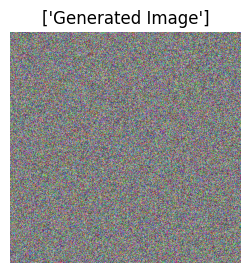

Iteration Number = 200
Total loss = tensor(9495993., device='cuda:0', grad_fn=<AddBackward0>)
Content loss = tensor(68.2506, device='cuda:0', grad_fn=<AddBackward0>)
Style loss = tensor(0.0003, device='cuda:0', grad_fn=<AddBackward0>)
1.0253062
-0.027919242


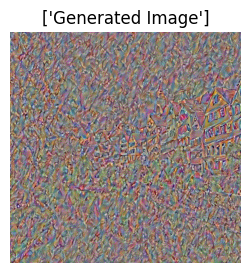

Iteration Number = 400
Total loss = tensor(6631396., device='cuda:0', grad_fn=<AddBackward0>)
Content loss = tensor(48.5856, device='cuda:0', grad_fn=<AddBackward0>)
Style loss = tensor(0.0002, device='cuda:0', grad_fn=<AddBackward0>)
1.0329232
-0.031135907


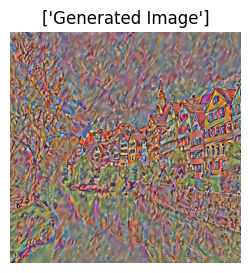

Iteration Number = 600
Total loss = tensor(9731702., device='cuda:0', grad_fn=<AddBackward0>)
Content loss = tensor(55.8774, device='cuda:0', grad_fn=<AddBackward0>)
Style loss = tensor(0.0004, device='cuda:0', grad_fn=<AddBackward0>)
1.103808
-0.08870415


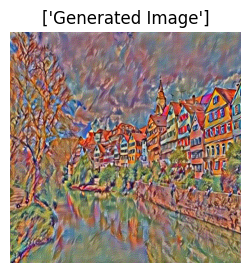

Iteration Number = 800
Total loss = tensor(4765777.5000, device='cuda:0', grad_fn=<AddBackward0>)
Content loss = tensor(36.4614, device='cuda:0', grad_fn=<AddBackward0>)
Style loss = tensor(0.0001, device='cuda:0', grad_fn=<AddBackward0>)
1.0245088
-0.027142942


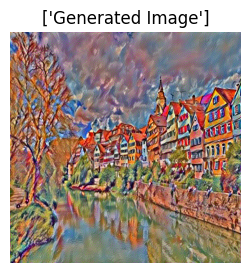

Iteration Number = 1000
Total loss = tensor(4807642., device='cuda:0', grad_fn=<AddBackward0>)
Content loss = tensor(34.8945, device='cuda:0', grad_fn=<AddBackward0>)
Style loss = tensor(0.0001, device='cuda:0', grad_fn=<AddBackward0>)
1.0267421
-0.023790939


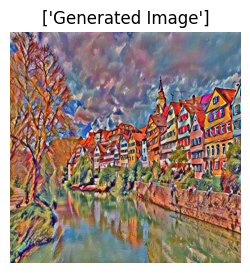

Iteration Number = 1200
Total loss = tensor(8087394., device='cuda:0', grad_fn=<AddBackward0>)
Content loss = tensor(35.3636, device='cuda:0', grad_fn=<AddBackward0>)
Style loss = tensor(0.0005, device='cuda:0', grad_fn=<AddBackward0>)
1.0718216
-0.0949675


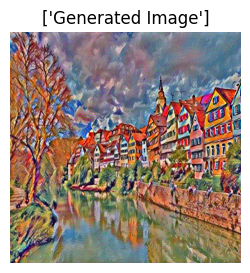

Iteration Number = 1400
Total loss = tensor(4432653.5000, device='cuda:0', grad_fn=<AddBackward0>)
Content loss = tensor(33.0633, device='cuda:0', grad_fn=<AddBackward0>)
Style loss = tensor(0.0001, device='cuda:0', grad_fn=<AddBackward0>)
1.0179325
-0.01730721


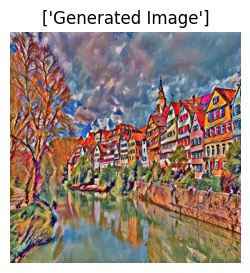

Iteration Number = 1600
Total loss = tensor(4171235.2500, device='cuda:0', grad_fn=<AddBackward0>)
Content loss = tensor(31.9574, device='cuda:0', grad_fn=<AddBackward0>)
Style loss = tensor(9.7549e-05, device='cuda:0', grad_fn=<AddBackward0>)
1.0205256
-0.018975744


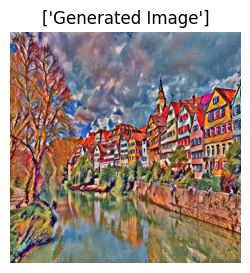

Iteration Number = 1800
Total loss = tensor(10917311., device='cuda:0', grad_fn=<AddBackward0>)
Content loss = tensor(41.0126, device='cuda:0', grad_fn=<AddBackward0>)
Style loss = tensor(0.0007, device='cuda:0', grad_fn=<AddBackward0>)
1.0881354
-0.09354337


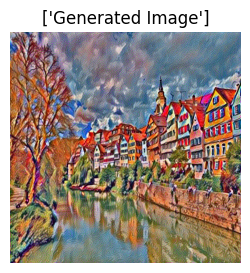

In [16]:
def display_image(image):

    title = ['Generated Image']
    plt.figure(figsize=(3,3))
    disp_image =  torch.permute(image.to('cpu'),(0,3,2,1)).detach().numpy()
    # Won't need to rescale image as are not drawing from dataloader which is pre scaled.
    #mean = np.array([0.485, 0.456, 0.406])
    #std = np.array([0.229, 0.224, 0.225])
    #disp_image = std * disp_image + mean
    print(np.max(disp_image))
    print(np.min(disp_image))
    disp_image = np.clip(disp_image, 0, 1)
    plt.title(title)
    plt.imshow(disp_image[0,:,:,:])
    plt.axis('off')
    plt.show()

iterations = 2000

for iterations in range(iterations):

    #pert_noise = tf.random.normal([1, H+T,W+T,3],mean=0.0,stddev=1)
    #latent_vector=rnd_img_data+pert_noise
    s_loss,c_loss,t_loss,rnd_img = train_step(ip_img)

    if iterations % 200 == 0:
       print('Iteration Number =',iterations)
       print('Total loss =',t_loss)
       print('Content loss =',c_loss)
       print('Style loss =',s_loss)

       #print('Total Variation Loss=',tv_loss)
       display_image(rnd_img)

       # Write loss curves to tensorboard
       writer.add_scalars('Loss',
                     { f"Content Loss" : c_loss, f"Style Loss" : s_loss, f"Total Loss": t_loss }, iterations)


In [17]:
print(np.max(ip_img.to('cpu').detach().numpy()))
print(np.min(ip_img.to('cpu').detach().numpy()))

1.0244961
-0.025901444


In [18]:
#%load_ext tensorboard
%reload_ext tensorboard
%tensorboard --logdir runs --bind_all


<IPython.core.display.Javascript object>